In [1]:
# Import libraries necessary for this project
import numpy as np
import pandas as pd
from time import time
from IPython.display import display # Allows the use of display() for DataFrames
import data_preprocess as dp

from Utils import *

%matplotlib inline
conn = dp.uncompress_and_open_sqlite()
print ("Players")
players_df = dp.sql_to_dataframe(conn, select_all_query_table("Player_Attributes"))
display(players_df.head(n=1))
print ("Teams")
teams_df = dp.sql_to_dataframe(conn, select_all_query_table("Team_Attributes"))
display(teams_df.head(n=1))
print ("Matches")
match_df = dp.sql_to_dataframe(conn, select_all_query_table("Match"))
display(match_df.head(n=1))

Players


,id,player_fifa_api_id,player_api_id,date,overall_rating,potential,preferred_foot,attacking_work_rate,defensive_work_rate,crossing,...,vision,penalties,marking,standing_tackle,sliding_tackle,gk_diving,gk_handling,gk_kicking,gk_positioning,gk_reflexes
0,1,218353,505942,2016-02-18 00:00:00,67.0,71.0,right,medium,medium,49.0,...,54.0,48.0,65.0,69.0,69.0,6.0,11.0,10.0,8.0,8.0


Teams


,id,team_fifa_api_id,team_api_id,date,buildUpPlaySpeed,buildUpPlaySpeedClass,buildUpPlayDribbling,buildUpPlayDribblingClass,buildUpPlayPassing,buildUpPlayPassingClass,...,chanceCreationShooting,chanceCreationShootingClass,chanceCreationPositioningClass,defencePressure,defencePressureClass,defenceAggression,defenceAggressionClass,defenceTeamWidth,defenceTeamWidthClass,defenceDefenderLineClass
0,1,434,9930,2010-02-22 00:00:00,60,Balanced,NaN,Little,50,Mixed,...,55,Normal,Organised,50,Medium,55,Press,45,Normal,Cover


Matches


,id,country_id,league_id,season,stage,date,match_api_id,home_team_api_id,away_team_api_id,home_team_goal,...,SJA,VCH,VCD,VCA,GBH,GBD,GBA,BSH,BSD,BSA
0,1,1,1,2008/2009,1,2008-08-17 00:00:00,492473,9987,9993,1,...,4.0,1.65,3.4,4.5,1.78,3.25,4.0,1.73,3.4,4.2


In [2]:
data = pd.read_csv('Data_Structures/FINAL_BASE_DATASET_TEAM_RATINGS_ADDED_NO_BETS_ZEROS_NOT_REMOVED.csv',index_col=0)

In [9]:
len(data.columns)

54

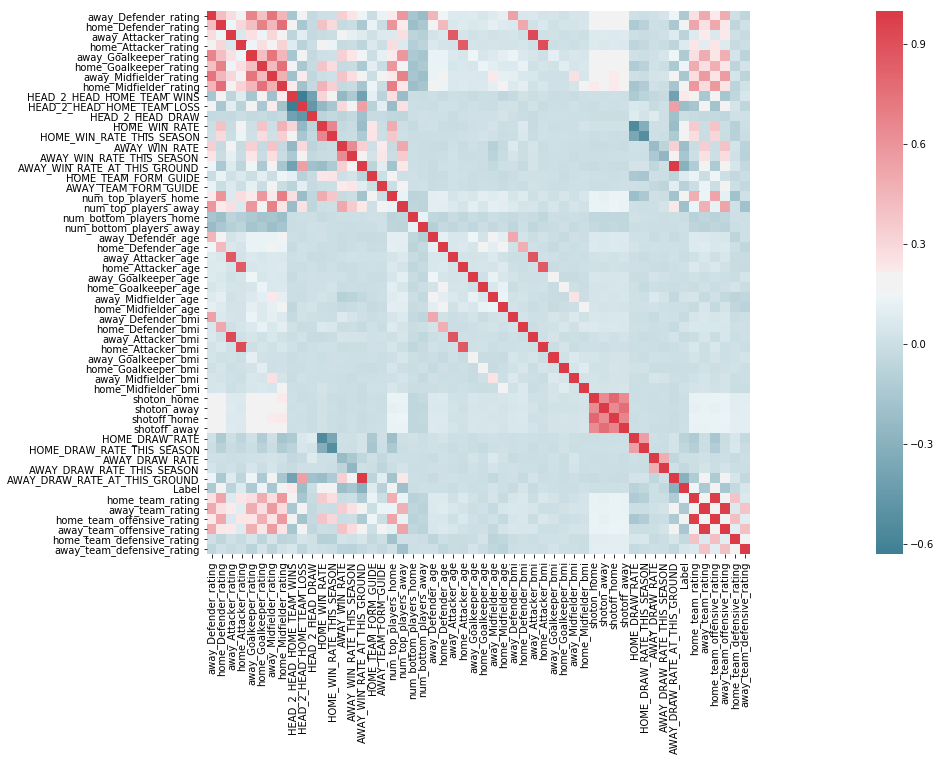

In [12]:
# Drop columns from them samples
import seaborn as sns
import matplotlib.pyplot as plt
corr = data.corr()
plt.figure(figsize=(45,10))
sns.heatmap(corr, mask=np.zeros_like(corr, dtype=np.bool), cmap=sns.diverging_palette(220, 10, as_cmap=True),
            square=True)


We can see that rating, age, and bmi have positive correlation. We can see that the result is not correlated to any feature! 

In [30]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
def cluster_results(reduced_data, preds, centers, pca_samples):
    '''
    Visualizes the PCA-reduced cluster data in two dimensions
    Adds cues for cluster centers and student-selected sample data
    '''

    predictions = pd.DataFrame(preds, columns = ['Cluster'])
    plot_data = pd.concat([predictions, reduced_data], axis = 1)

    # Generate the cluster plot
    fig, ax = plt.subplots(figsize = (14,8))

    # Color map
    cmap = cm.get_cmap('gist_rainbow')

    # Color the points based on assigned cluster
    for i, cluster in plot_data.groupby('Cluster'):   
        cluster.plot(ax = ax, kind = 'scatter', x = 'Dimension 1', y = 'Dimension 2', \
                 color = cmap((i)*1.0/(len(centers)-1)), label = 'Cluster %i'%(i), s=30);

    
    # Plot centers with indicators
    for i, c in enumerate(centers):
        ax.scatter(x = c[0], y = c[1], color = 'white', edgecolors = 'black', \
                   alpha = 1, linewidth = 2, marker = 'o', s=200);
        ax.scatter(x = c[0], y = c[1], marker='$%d$'%(i), alpha = 1, s=100);
    
    Label_color_map = {'Label 0': 'black', 'Label 1' : 'orange', 'Label 2': 'green'}
    for label in pca_samples:
        # Plot transformed sample points 
        list_samples = pca_samples[label]
        ax.scatter(x = pca_samples[label][:,0], y = pca_samples[label][:,1], \
                   s = 150, linewidth = 4, color = Label_color_map[label], marker = 'x',label=label);
        plt.legend()

    # Set plot title
    ax.set_title("Cluster Learning on PCA-Reduced Data - Centroids Marked by Number\nTransformed Sample Data Marked by Black Cross");

In [9]:
from sklearn.decomposition import PCA
data_1=data.drop(['Label'],axis=1)
pca = PCA(n_components=2)
pca.fit(data_1)
print(pca.explained_variance_ratio_)  

[ 0.29691115  0.26838913]


Text(0,0.5,'Cumulative explained variance')

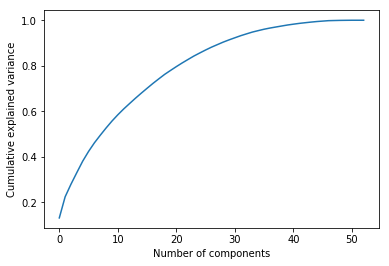

In [17]:
## finding the optimum number of components

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

X_std = StandardScaler().fit_transform(data_1)

pca = PCA().fit(X_std)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
#plt.xlim(0,7,1)
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')

In [18]:
np.cumsum(pca.explained_variance_ratio_)

array([ 0.13197603,  0.22474088,  0.28020504,  0.33121571,  0.38121288,
        0.42384819,  0.46170839,  0.49502305,  0.527033  ,  0.55725885,
        0.58482242,  0.61034947,  0.63401089,  0.65731195,  0.67964434,
        0.70127325,  0.72259998,  0.74264571,  0.76227116,  0.77952396,
        0.79640398,  0.81257768,  0.82781063,  0.84288385,  0.85629626,
        0.86939137,  0.88175124,  0.8928636 ,  0.90391262,  0.91379654,
        0.9230517 ,  0.93219615,  0.94026175,  0.9481453 ,  0.95447725,
        0.96062346,  0.96578016,  0.97029045,  0.97473522,  0.97912054,
        0.98274935,  0.98621093,  0.98909489,  0.99185611,  0.99433491,
        0.99626028,  0.99815315,  0.9987997 ,  0.99941014,  0.99972696,
        0.99999965,  1.        ,  1.        ])

In [4]:
import seaborn as sns

%matplotlib inline
sns.set(style="ticks")
g=sns.pairplot(data,hue='Label')

for i, j in zip(*np.triu_indices_from(g.axes, 1)):
    g.axes[i, j].set_visible(False)

In [5]:
g.savefig("pairplot.png")

In [17]:
data_label_0=data.loc[data['Label']==0].drop('Label',axis=1)
data_label_1=data.loc[data['Label']==1].drop('Label',axis=1)
data_label_2=data.loc[data['Label']==2].drop('Label',axis=1)

In [21]:
display(data_label_0.shape[0])
display(data_label_1.shape[0])
display(data_label_2.shape[0])

4972

4412

7975

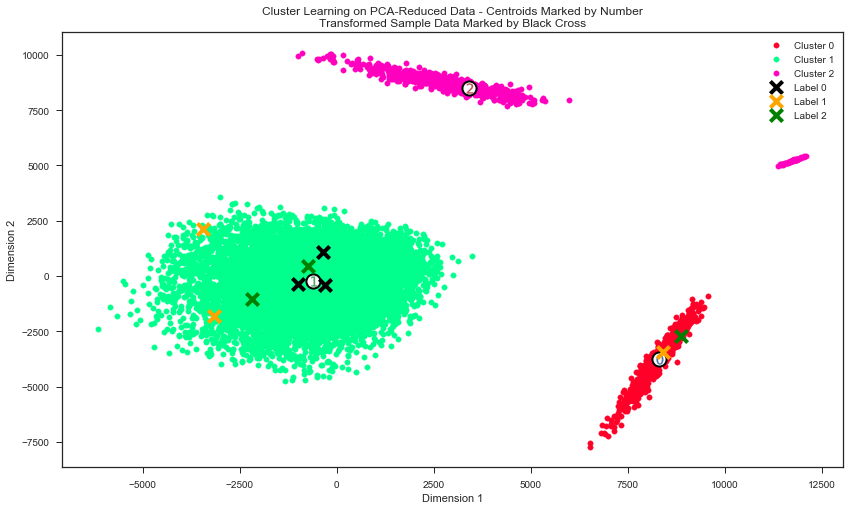

In [37]:
from sklearn.cluster import KMeans

data_1_reduced = pca.transform(data_1)

# Apply pca on the samples - Labels 0,1,2 etc.
pca_label_0 = pca.transform(data_label_0.sample(3,random_state=1))
pca_label_1 = pca.transform(data_label_1.sample(3,random_state=2))
pca_label_2 = pca.transform(data_label_2.sample(3,random_state=5))


pca_samples = dict()
pca_samples['Label 0'] = pca_label_0
pca_samples['Label 1'] = pca_label_1
pca_samples['Label 2'] = pca_label_2


# Create a DataFrame for the reduced data
data_1_reduced_df = pd.DataFrame(data_1_reduced, columns = ['Dimension 1', 'Dimension 2'])

kmeans = KMeans(n_clusters=3, random_state=0).fit(data_1_reduced_df)

preds = kmeans.predict(data_1_reduced_df)

cluster_results(reduced_data=data_1_reduced_df, preds=preds, centers=kmeans.cluster_centers_,pca_samples=pca_samples)
